## Initialisation

In [1]:
%matplotlib inline 
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import mne
from autoreject import AutoReject

## Ouverture du fichier MEG et affichage des infos

In [2]:
data_path = '/home/lucas/Documents/Data_MEG/sub-V1001/'
raw_file = data_path + 'meg/sub-V1001_task-visual_meg.ds'
raw = mne.io.read_raw_ctf(raw_file)

# Affichage des informations sur les canaux
print(raw.info)
raw

ds directory : /home/lucas/Documents/Data_MEG/sub-V1001/meg/sub-V1001_task-visual_meg.ds
    res4 data read.
    hc data read.
    Separate EEG position data file not present.
    Quaternion matching (desired vs. transformed):
      -0.50   80.15    0.00 mm <->   -0.50   80.15    0.00 mm (orig :  -71.73   42.77 -259.14 mm) diff =    0.000 mm
       0.50  -80.15    0.00 mm <->    0.50  -80.15    0.00 mm (orig :   37.79  -74.15 -264.78 mm) diff =    0.000 mm
     108.63    0.00    0.00 mm <->  108.63   -0.00   -0.00 mm (orig :   62.71   58.11 -264.02 mm) diff =    0.000 mm
    Coordinate transformations established.
    Polhemus data for 3 HPI coils added
    Device coordinate locations for 3 HPI coils added
Picked positions of 4 EEG channels from channel info
    4 EEG locations added to Polhemus data.
    Measurement info composed.
Finding samples for /home/lucas/Documents/Data_MEG/sub-V1001/meg/sub-V1001_task-visual_meg.ds/sub-V1001_task-visual_meg.meg4: 
    System clock channel is a

<RawCTF | sub-V1001_task-visual_meg.meg4, 352 x 4832825 (4027.4 s), ~582 kB, data not loaded>

## On peut afficher l'emplacement des différentes électrodes 

Removing 5 compensators from info because not all compensation channels were picked.
Removing 5 compensators from info because not all compensation channels were picked.
Removing 5 compensators from info because not all compensation channels were picked.


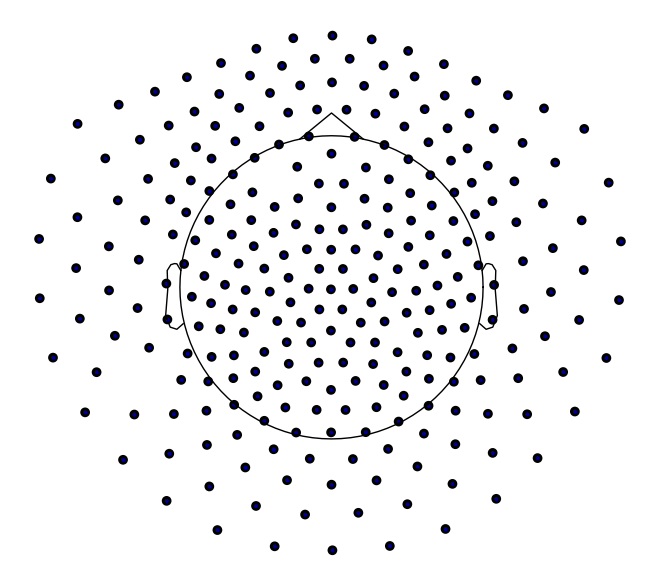

In [25]:
raw.plot_sensors(kind='topomap', ch_type='mag');

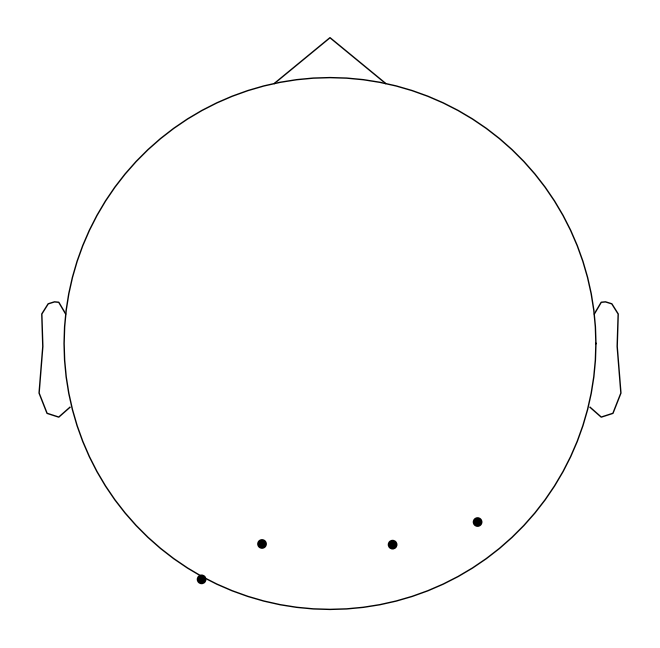

In [26]:
raw.plot_sensors(kind='topomap', ch_type='eeg');

## Chargement d'une partie des données en mémoire pour pouvoir les analyser

In [3]:
raw.crop(0, 600).pick_types(meg='mag', stim=True, eeg=True, eog=True).load_data()
raw.load_data() 
#raw.resample(600)

Reading 0 ... 720000  =      0.000 ...   600.000 secs...


<RawCTF | sub-V1001_task-visual_meg.meg4, 308 x 720001 (600.0 s), ~1.65 GB, data loaded>

## Détection d'artefacts et filtrage des données

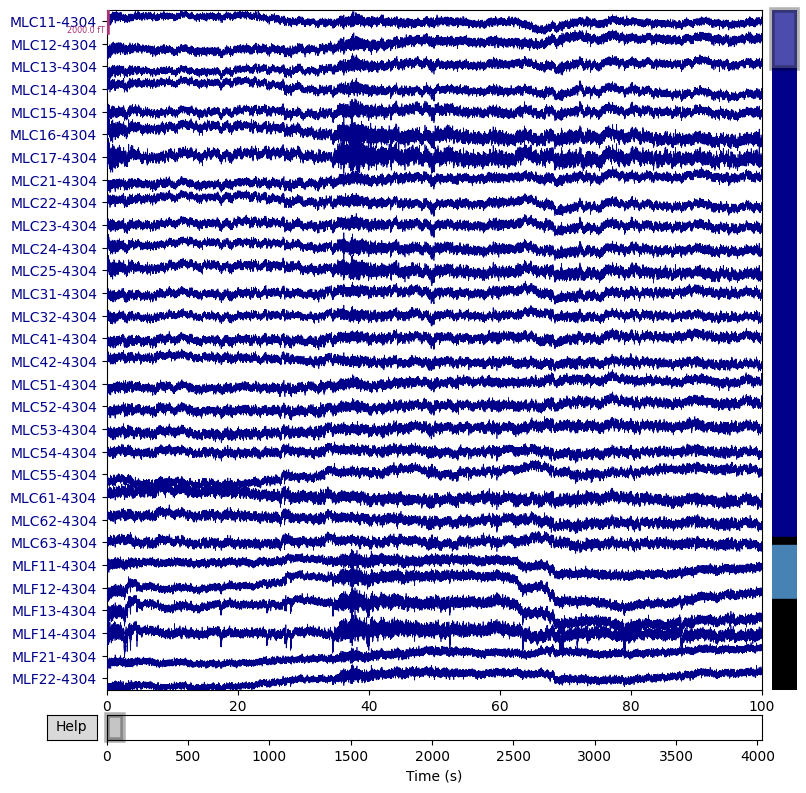

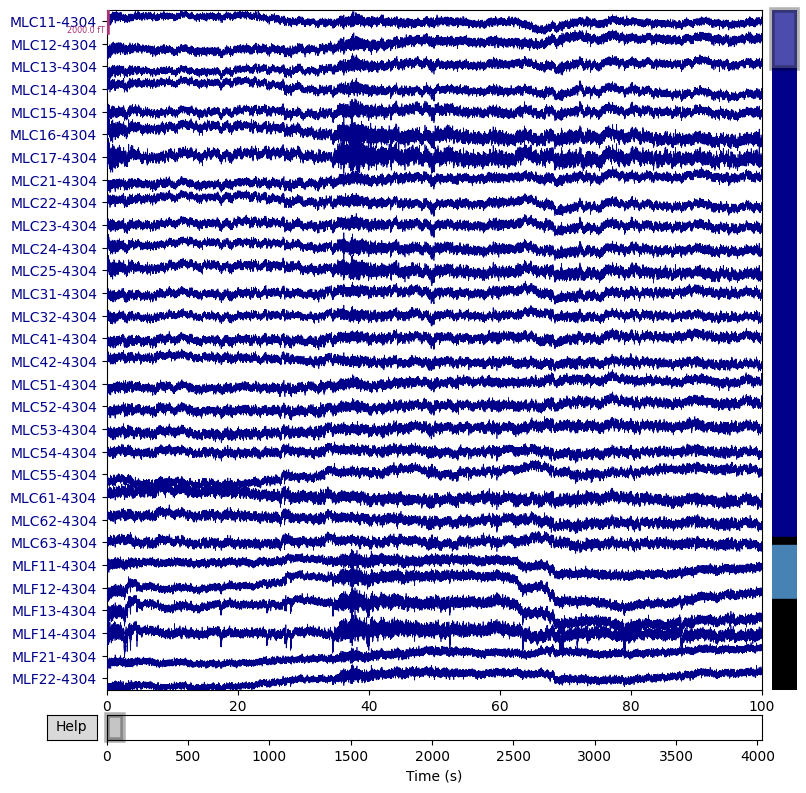

In [6]:
raw.plot(duration=100, proj=False, n_channels=30,remove_dc=True)

Filtrage pour s'affranchir du low-frequency drift

In [7]:
raw.filter(l_freq=1, h_freq=None)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 3961 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 305 out of 305 | elapsed:    5.7s finished


<RawCTF | sub-V1001_task-visual_meg.meg4, 308 x 720001 (600.0 s), ~1.65 GB, data loaded>

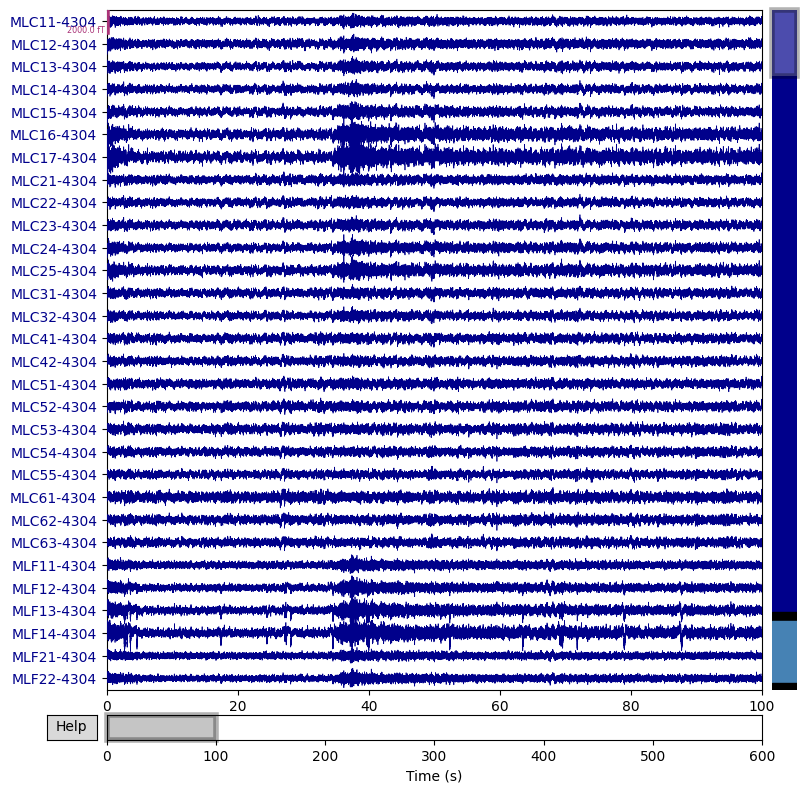

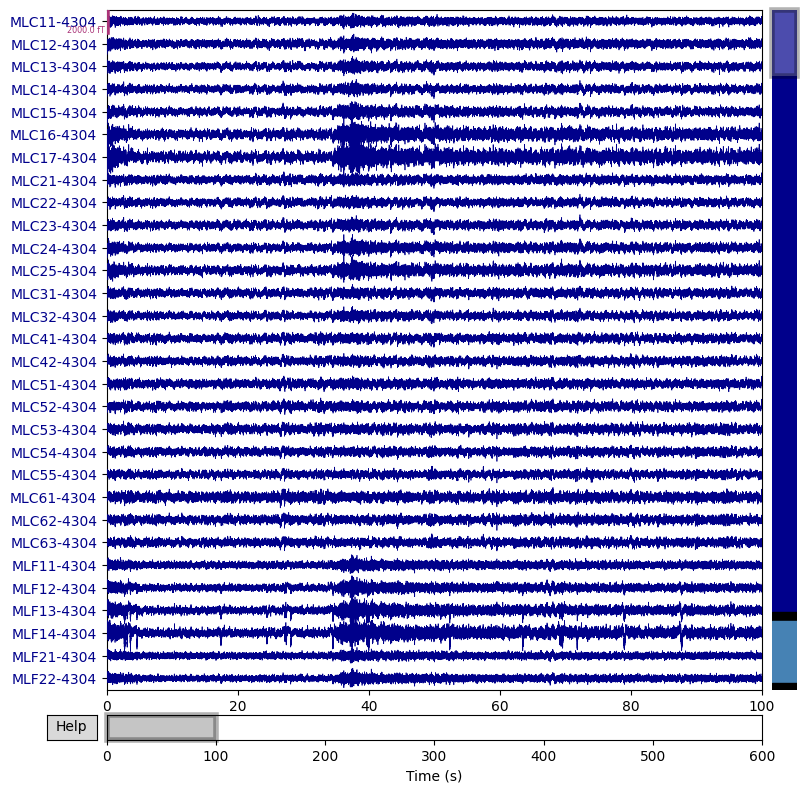

In [10]:
raw.plot(duration=100, proj=False, n_channels=30)

Identification du power line noise

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 1.707 (s)


/tmp/ipykernel_110672/2090375220.py:1: UserWarning: Zero value in spectrum for channel EEG060
  raw.plot_psd(fmax=250, average=True)
/tmp/ipykernel_110672/2090375220.py:1: UserWarning: Infinite value in PSD for channel EEG060.
These channels might be dead.
  raw.plot_psd(fmax=250, average=True)
/home/lucas/env_python/mne/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


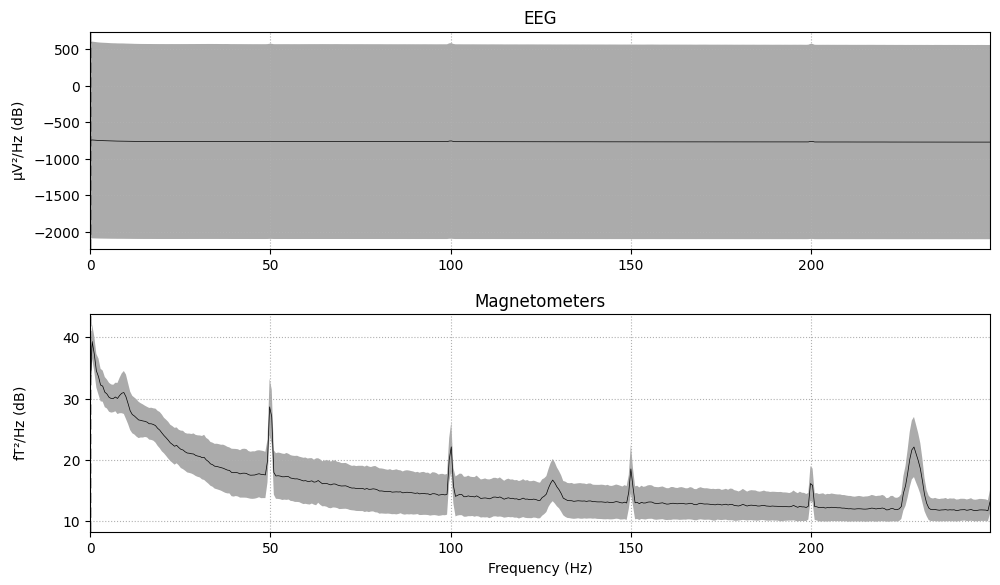

In [4]:
raw.plot_psd(fmax=250, average=True)

In [4]:
meg_picks = mne.pick_types(raw.info, meg=True, eeg=False, eog=False, stim=False, exclude='bads')
freqs = [50]
raw.notch_filter(freqs=freqs, picks=meg_picks, method='spectrum_fit', filter_length='10s')

Removed notch frequencies (Hz):
     50.00 : 35819 windows


<RawCTF | sub-V1001_task-visual_meg.meg4, 308 x 720001 (600.0 s), ~1.65 GB, data loaded>

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Removing 5 compensators from info because not all compensation channels were picked.
Effective window size : 1.707 (s)


/tmp/ipykernel_71466/2090375220.py:1: UserWarning: Zero value in spectrum for channel EEG060
  raw.plot_psd(fmax=250, average=True)
/tmp/ipykernel_71466/2090375220.py:1: UserWarning: Infinite value in PSD for channel EEG060.
These channels might be dead.
  raw.plot_psd(fmax=250, average=True)
/home/lucas/env_python/mne/lib/python3.10/site-packages/mne/viz/utils.py:137: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


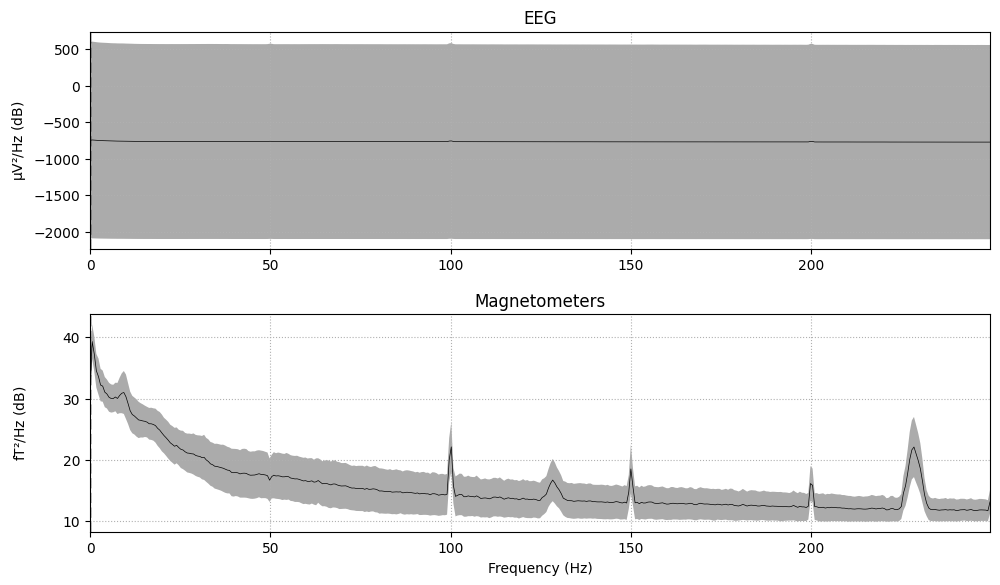

In [5]:
raw.plot_psd(fmax=250, average=True)

## Structure des données et événements

In [6]:
events = mne.find_events(raw, stim_channel='UPPT001', verbose=True)

1082 events found
Event IDs: [ 1  2  5  6  7  8 10 15 20 40]


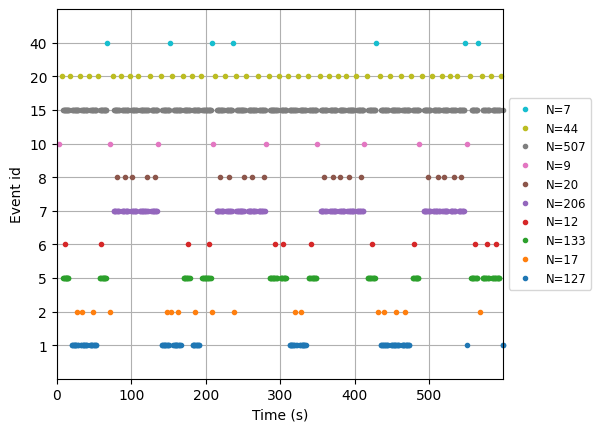

In [6]:
fig = mne.viz.plot_events(events, raw.info['sfreq']);

In [ ]:
event_id = {
    'onset/sentence/RC+sentence/individual_word': 1,
    'onset/sentence/RC+sentence/target_word': 2,
    'onset/sentence/RC-sentence/individual_word': 5,
    'onset/sentence/RC-sentence/target_word': 6,
    'onset/word_list/RC-sentence/individual_word': 7,
    'onset/word_list/RC-sentence/target_word': 8,
    'instruction/word_or_sentence': 10,
    'offset': 15,
    'pre-trial_baseline': 20,
    'question': 40
}

In [ ]:
event_id = {
    '1': 1,
    '2': 2,
    '5': 5,
    '6': 6,
    '7': 7,
    '8': 8,
    'instruction': 10,
    'O': 15
}

/tmp/ipykernel_142488/1043894322.py:1: RuntimeWarning: event 3 missing from event_id will be ignored
  fig = mne.viz.plot_events(events, sfreq=raw.info['sfreq'],
/tmp/ipykernel_142488/1043894322.py:1: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  fig = mne.viz.plot_events(events, sfreq=raw.info['sfreq'],


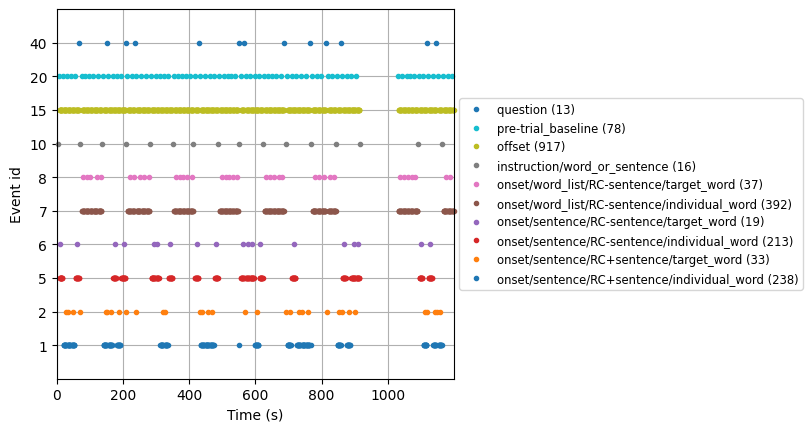

In [ ]:
fig = mne.viz.plot_events(events, sfreq=raw.info['sfreq'],
                          event_id=event_id)

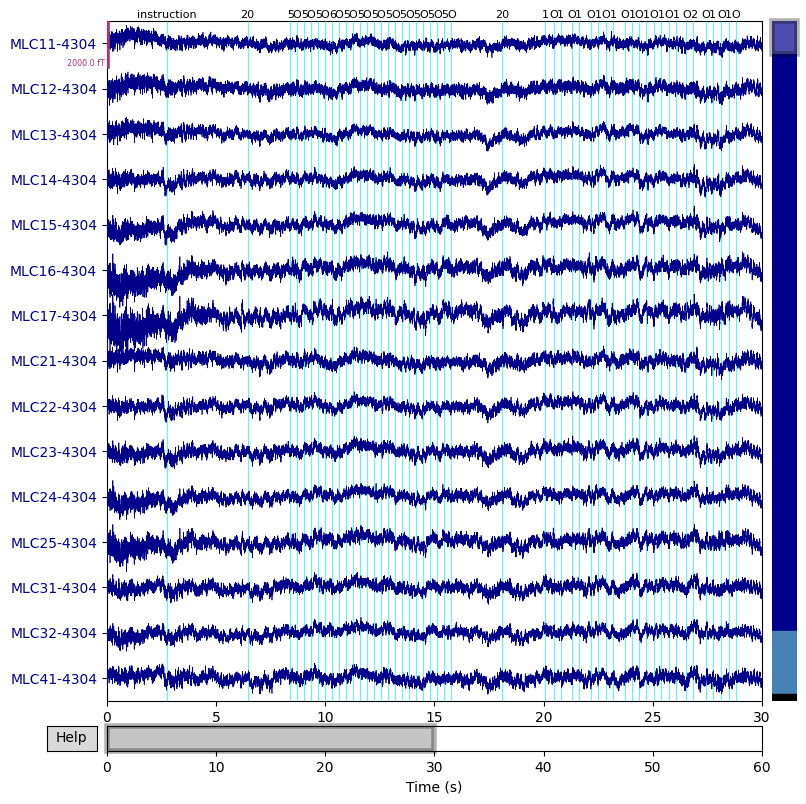

In [ ]:
raw.plot(duration=30, n_channels=15, event_id=event_id, events=events);

## Comparaison des ICA entre les phrases simples et listes de mots mélangés associées

In [18]:
def epochs_phrase_liste(events):
    phrases = []
    listes = []
    for i in range(len(events)):
        if events[i,2]==20:
            if events[i+1,2]==5:
                phrases.append(events[i])
            elif events[i+1,2]==7:
                listes.append(events[i])
    return phrases,listes


In [19]:
def ecart_event(events):
    duree = []
    for i in range(events.shape[0]-1):
        duree.append(np.abs(events[i+1,0] - events[i,0]))
    return np.array(duree)/raw.info['sfreq']

Fonction permettant de déterminer le nombre de composantes principales à prendre pour obtenir un taux de variance expliquée choisie

In [20]:
def nb_pca_components(ica, taux):
    vp = ica.pca_explained_variance_
    vp = vp/sum(vp)
    nb = 0
    explained_variance = vp[0]
    while explained_variance < taux:
        nb += 1
        explained_variance += vp[nb]
    return nb + 1

In [21]:
def epoching(raw, events, tmin, tmax):
    picks = mne.pick_types(raw.info, meg=True, eeg=False, eog=False, stim=False, exclude='bads')
    epochs = mne.Epochs(raw, events, {'pre-trial_baseline':20}, tmin, tmax, proj=True,
                    picks=picks, baseline=None)
    epochs.load_data()
    return epochs

On s'intéresse aux corrélations linéaires entre les différentes composantes indépedantes issues de l'ICA

In [22]:
def correlation(A, B):
    apparaiement = []
    if len(A) != len(B):
        return "Erreur : le nombre de composantes principales choisi pour les deux ICA est différent"
    l = len(A)
    for i in range(l):
        x = 0
        for j in range(l):
            Cov = np.corrcoef(A[i],B[j])
            pearson = np.abs(Cov[0,1])
            if pearson > x :
                x = pearson
                indice = j
        apparaiement.append(indice)
    return apparaiement

In [9]:
bloc = events[events[:,2]<9]

In [10]:
bloc

array([[ 10081,      0,      5],
       [ 10852,      0,      5],
       [ 11622,      0,      5],
       ...,
       [713643,      0,      5],
       [718901,      0,      1],
       [719997,      0,      1]])

In [11]:
duree_event = ecart_event(bloc)

In [12]:
np.mean(duree_event)

1.150966277561608

In [13]:
epochs_word = epoching(raw, events, 0.2,1.2)

Not setting metadata
44 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 44 events and 1201 original time points ...
0 bad epochs dropped


In [17]:
len(epochs_word.times)

1201

In [36]:
epochs_word.get_data().shape

(44, 301, 1201)

In [23]:
bloc = events[events[:,2]==20]
duree_bloc = ecart_event(bloc)
print(np.mean(duree_bloc))

13.742131782945739


In [24]:
tmin = -0.2  # start of each epoch (200ms before the trigger)
tmax = 15 # end of each epoch 

In [25]:
baseline = (-0.2, 0)  # means from 200ms before to stim onset (t = 0)

In [26]:
phrases, listes = epochs_phrase_liste(events)

In [27]:
print(len(phrases), len(listes))

12 20


In [28]:
epochs_phrases = epoching(raw, phrases, tmin, tmax)
epochs_listes = epoching(raw, listes, tmin, tmax)

Not setting metadata
12 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 12 events and 18241 original time points ...
0 bad epochs dropped
Not setting metadata
20 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 20 events and 18241 original time points ...
0 bad epochs dropped


In [30]:
len(epochs_listes.times)

18241

In [29]:
epochs_phrases.info

<Info | 15 non-empty values
 bads: []
 ch_names: BG1-4304, BG2-4304, BG3-4304, BP1-4304, BP3-4304, BR1-4304, ...
 chs: 28 Reference Magnetometers, 273 Magnetometers
 comps: 5 items (list)
 ctf_head_t: CTF/4D/KIT head -> head transform
 custom_ref_applied: False
 dev_ctf_t: MEG device -> CTF/4D/KIT head transform
 dev_head_t: MEG device -> head transform
 dig: 7 items (3 Cardinal, 4 EEG)
 highpass: 1.0 Hz
 hpi_results: 1 item (list)
 lowpass: 600.0 Hz
 meas_date: 1970-01-01 10:46:00 UTC
 meas_id: 4 items (dict)
 nchan: 301
 projs: []
 sfreq: 1200.0 Hz
 subject_info: 1 item (dict)
>

In [22]:
ica_phrases = mne.preprocessing.ICA(n_components=78)
ica_phrases.fit(epochs_phrases)

Fitting ICA to data using 273 channels (please be patient, this may take a while)
Removing 5 compensators from info because not all compensation channels were picked.
Selecting by number: 78 components
Fitting ICA took 64.8s.


Method,fastica
Fit,139 iterations on epochs (173299 samples)
ICA components,78
Available PCA components,273
Channel types,mag
ICA components marked for exclusion,—


In [23]:
explained_var_ratio = ica_phrases.get_explained_variance_ratio(epochs_phrases)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f'Fraction of {channel_type} variance explained by all components: '
        f'{ratio}'
    )

Fraction of mag variance explained by all components: 0.9500126573662633


In [21]:
nb_pca_components(ica_phrases, 0.95)

78

In [30]:
ica_listes = mne.preprocessing.ICA(n_components=78)
ica_listes.fit(epochs_listes)

Fitting ICA to data using 273 channels (please be patient, this may take a while)
Removing 5 compensators from info because not all compensation channels were picked.
Selecting by number: 78 components
Fitting ICA took 485.3s.


Method,fastica
Fit,679 iterations on epochs (337477 samples)
ICA components,78
Available PCA components,273
Channel types,mag
ICA components marked for exclusion,—


In [34]:
nb_pca_components(ica_listes, 0.95)

73

In [40]:
explained_var_ratio = ica_listes.get_explained_variance_ratio(epochs_listes)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f'Fraction of {channel_type} variance explained by all components: '
        f'{ratio}'
    )

Fraction of mag variance explained by all components: 0.9524530508013234


In [54]:
components_ica_phrases = ica_phrases.get_components()
components_ica_listes = ica_listes.get_components()

In [65]:
print(len(components_ica_phrases), len(components_ica_phrases[2]))

273 78


In [81]:
A = ica_phrases.unmixing_matrix_
B = ica_listes.unmixing_matrix_

In [106]:
A

array([[ 6.29998917e-02,  7.70579507e-02, -4.42395872e-02, ...,
         7.28745338e-03, -7.44324715e-02, -6.72913733e-02],
       [-3.27747771e-02,  1.18339787e-01, -1.50629705e-02, ...,
         7.33547281e-03,  5.64423181e-02, -3.11060395e-02],
       [ 5.59309806e-02, -5.62796731e-03,  2.26817644e-02, ...,
         9.14805523e-02,  1.70942200e-01, -1.08905213e-01],
       ...,
       [ 1.73912040e-03, -9.12200475e-03, -3.80842587e-04, ...,
        -4.77449674e-01, -5.20849640e-02, -1.19010046e-03],
       [ 1.82210345e-03, -4.35191425e-03,  1.70077186e-03, ...,
         3.89520446e-01, -7.50416775e-02, -1.37769789e-01],
       [ 2.92554632e-03,  8.38335936e-04, -6.35652285e-04, ...,
         1.28537222e-01, -2.88296523e-01, -4.12988032e-03]])

In [86]:
correlation(A,B)

[0,
 37,
 62,
 29,
 59,
 54,
 77,
 19,
 31,
 29,
 76,
 77,
 66,
 46,
 12,
 11,
 66,
 75,
 43,
 75,
 76,
 43,
 6,
 53,
 27,
 33,
 61,
 46,
 8,
 76,
 42,
 61,
 66,
 46,
 56,
 75,
 48,
 43,
 16,
 28,
 74,
 55,
 68,
 37,
 29,
 29,
 47,
 59,
 73,
 28,
 51,
 36,
 48,
 23,
 5,
 59,
 48,
 13,
 40,
 73,
 55,
 50,
 74,
 71,
 65,
 71,
 48,
 57,
 45,
 41,
 69,
 62,
 65,
 72,
 49,
 34,
 73,
 17]

In [101]:
Mat_cov = np.corrcoef(A, B, rowvar=False)

In [107]:
Mat_cov

array([[ 1.        , -0.04102655,  0.01964   , ..., -0.03006615,
        -0.01431469, -0.0758338 ],
       [-0.04102655,  1.        ,  0.0097902 , ...,  0.04066347,
         0.0679242 ,  0.10860701],
       [ 0.01964   ,  0.0097902 ,  1.        , ...,  0.07479859,
        -0.02782016,  0.05058251],
       ...,
       [-0.03006615,  0.04066347,  0.07479859, ...,  1.        ,
        -0.00506516, -0.02055825],
       [-0.01431469,  0.0679242 , -0.02782016, ..., -0.00506516,
         1.        , -0.00305574],
       [-0.0758338 ,  0.10860701,  0.05058251, ..., -0.02055825,
        -0.00305574,  1.        ]])

In [ ]:
def correlation_ica(A,B):
    Cov = np.corrcoef(A,B)
    for i in range(len(A)):
        

In [74]:
print(len(A), len(A[0]))

78 78


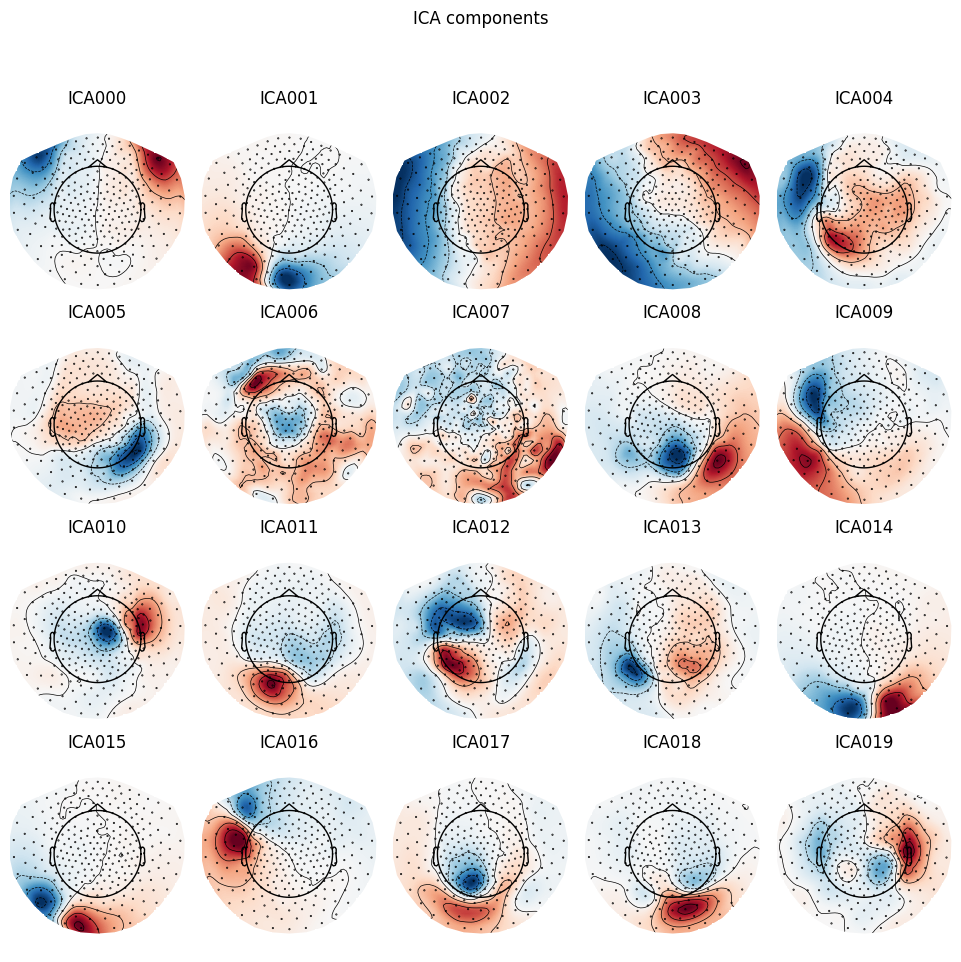

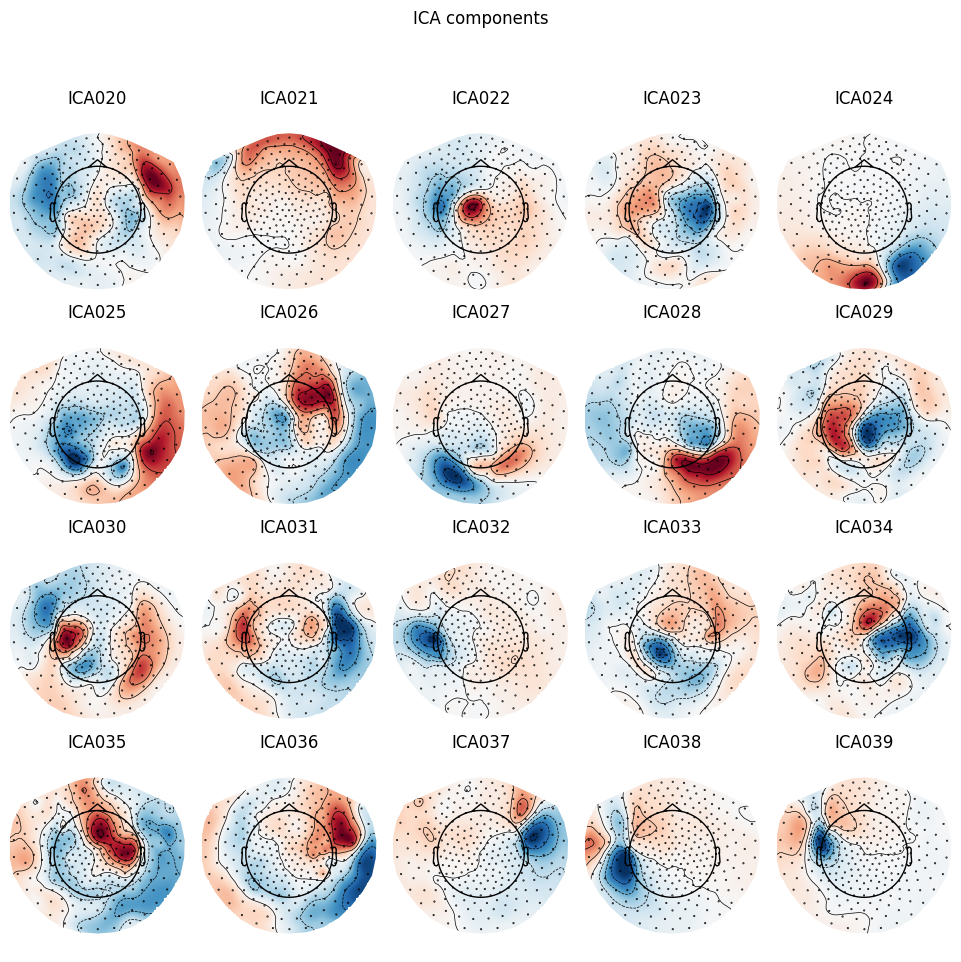

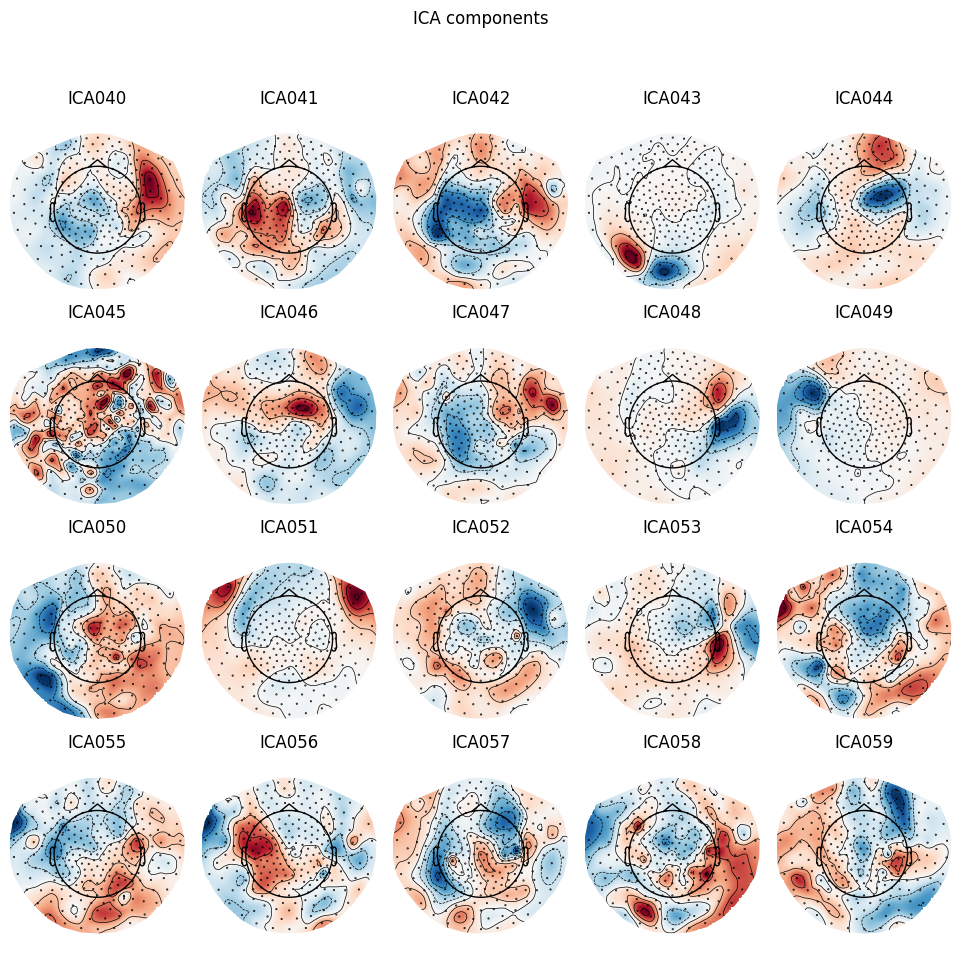

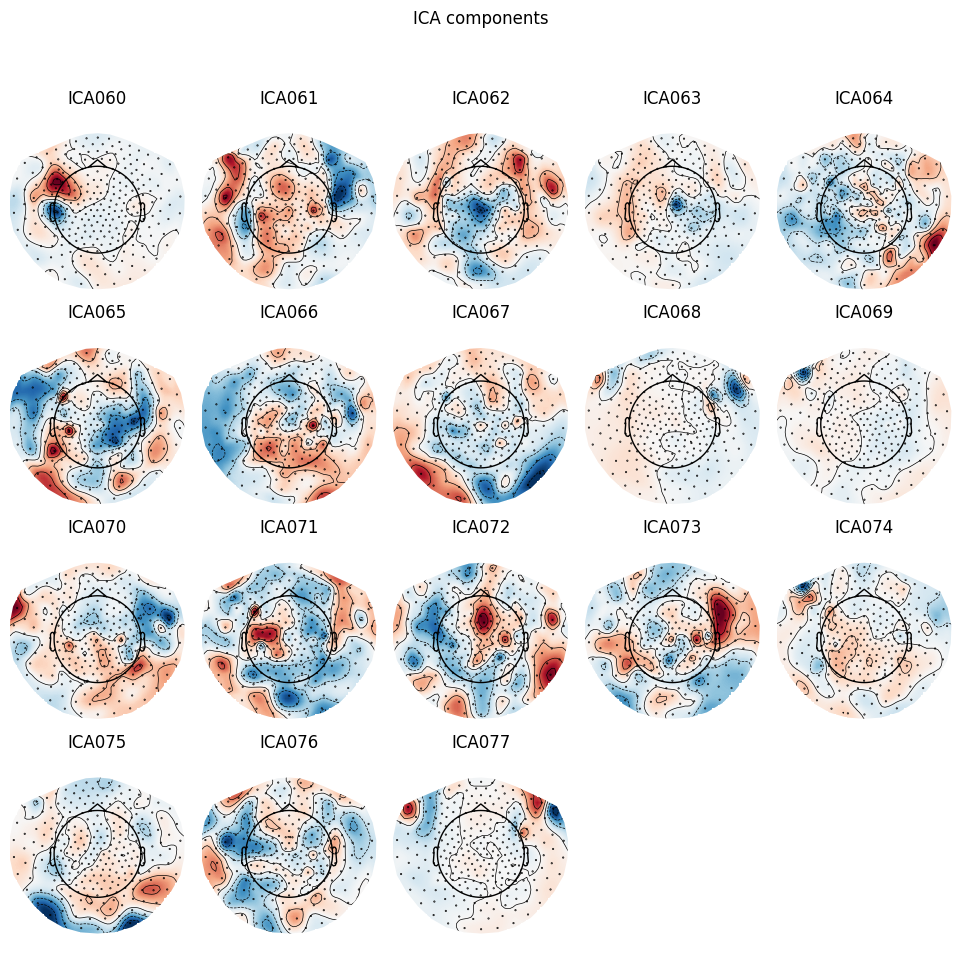

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 18 Axes>]

In [31]:
ica_phrases.plot_components()

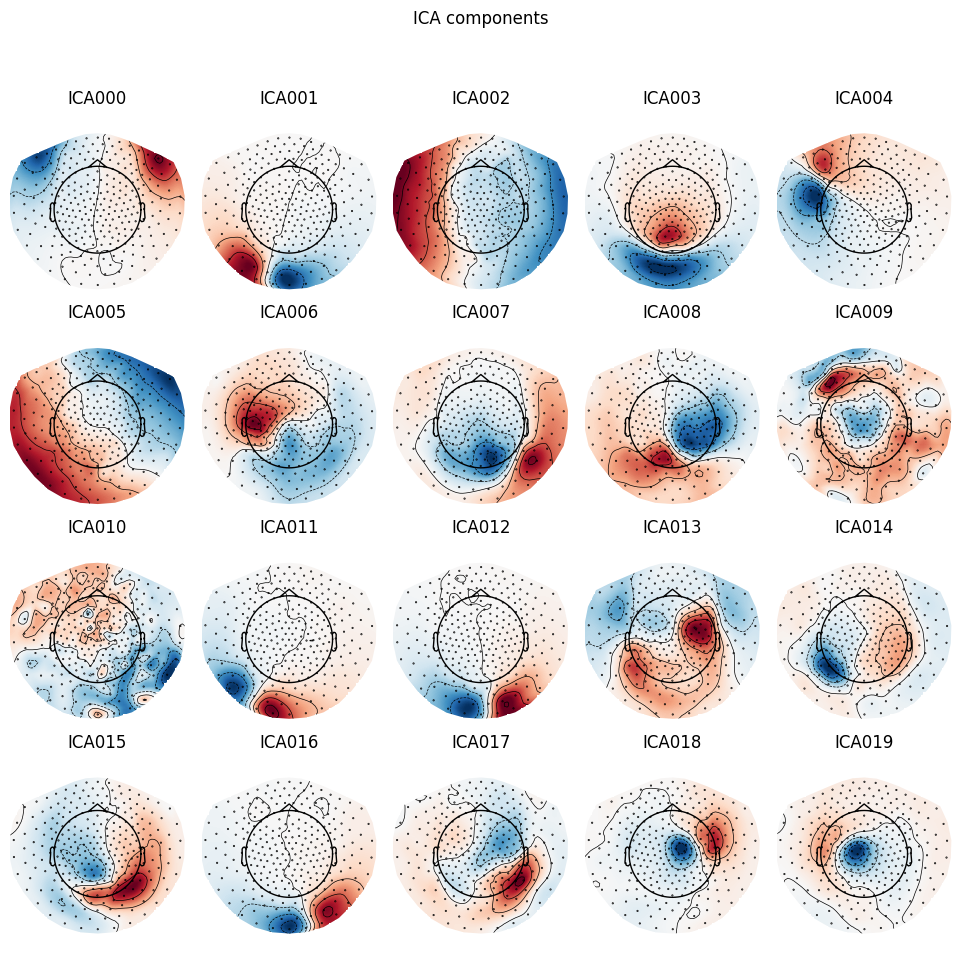

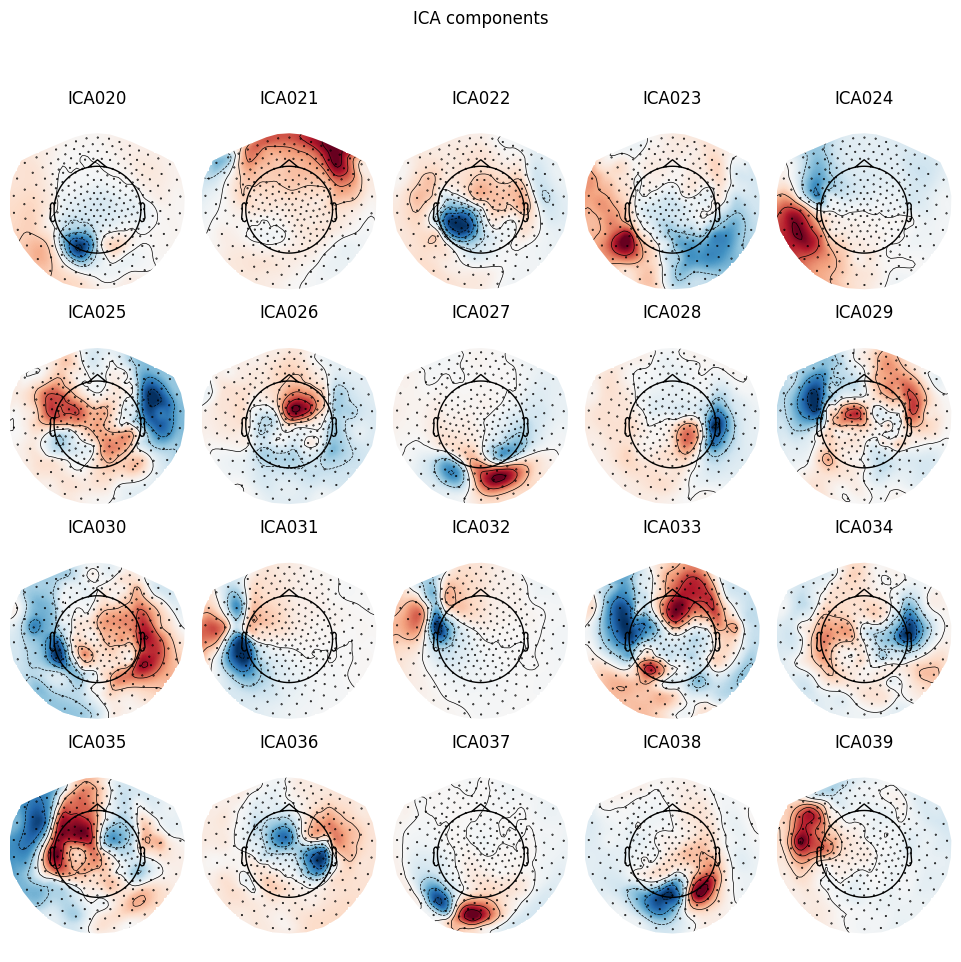

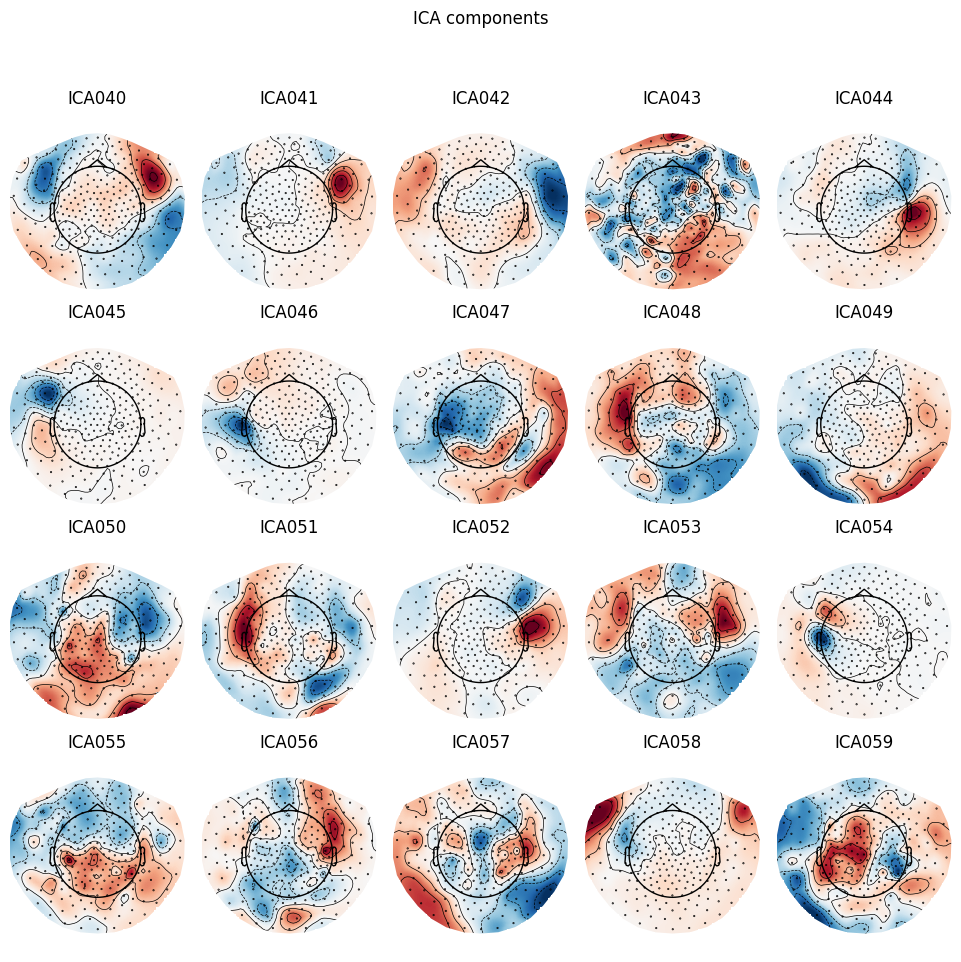

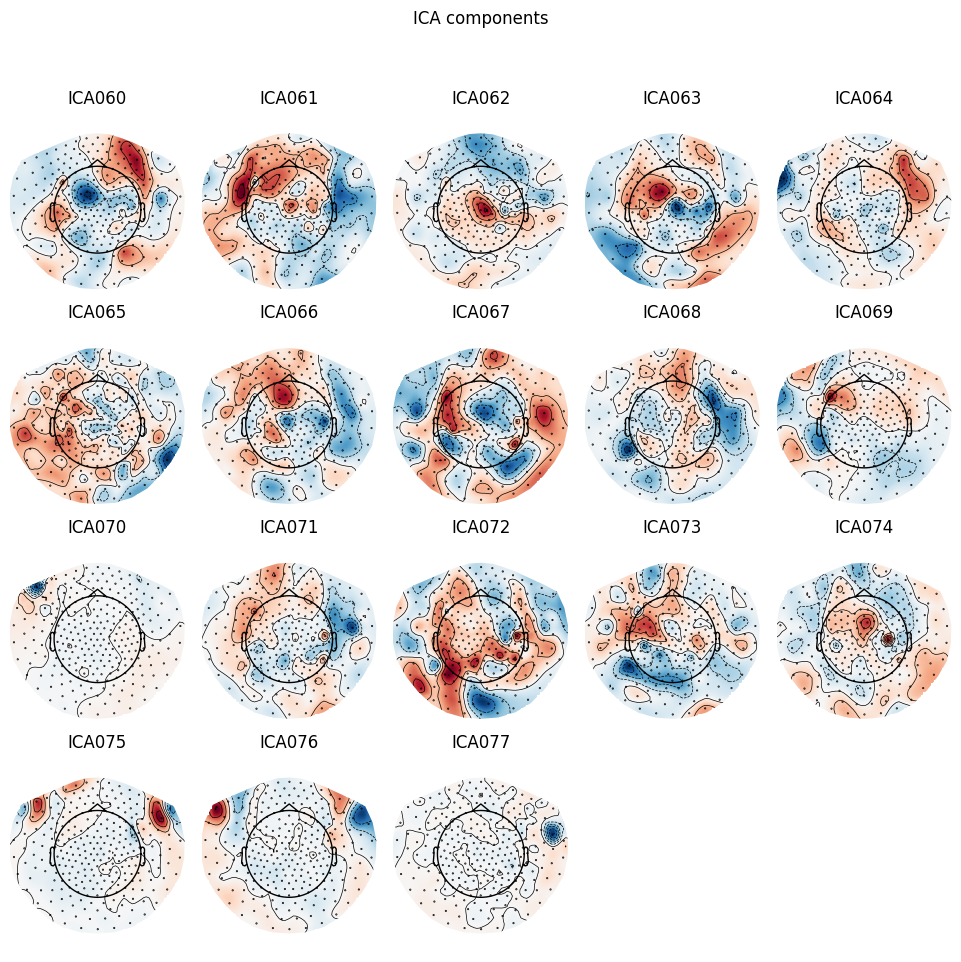

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 18 Axes>]

In [36]:
ica_listes.plot_components()

Creating RawArray with float64 data, n_channels=78, n_times=720000
    Range : 0 ... 719999 =      0.000 ...  1199.998 secs
Ready.


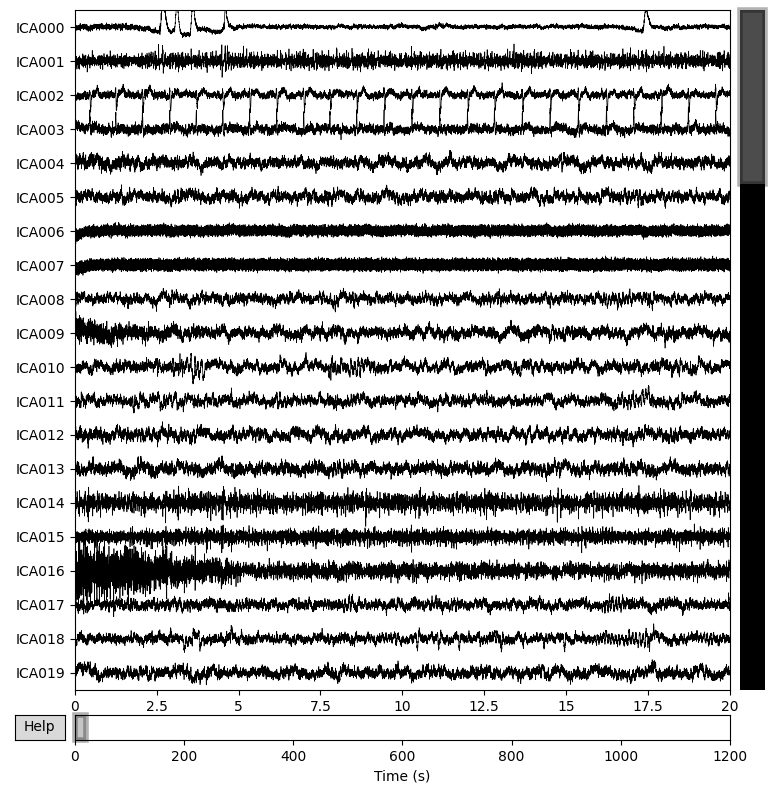

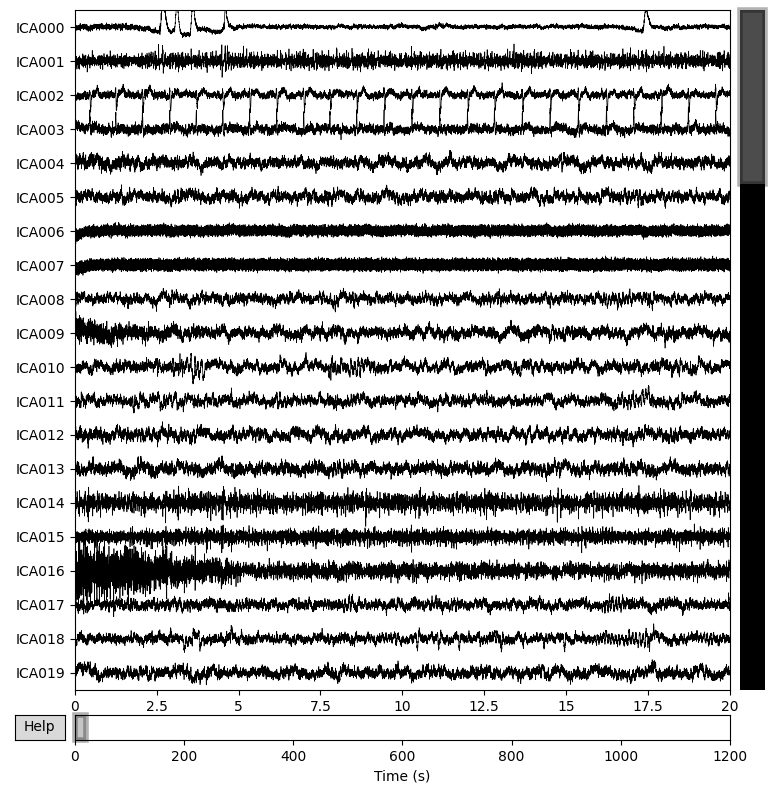

In [89]:
ica_phrases.plot_sources(raw)

Creating RawArray with float64 data, n_channels=78, n_times=720000
    Range : 0 ... 719999 =      0.000 ...  1199.998 secs
Ready.


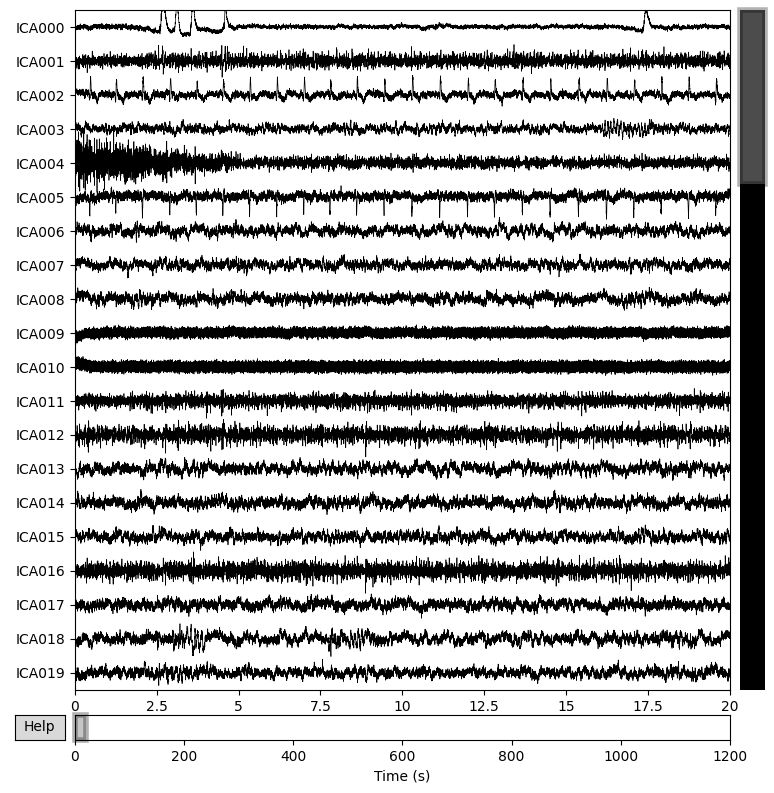

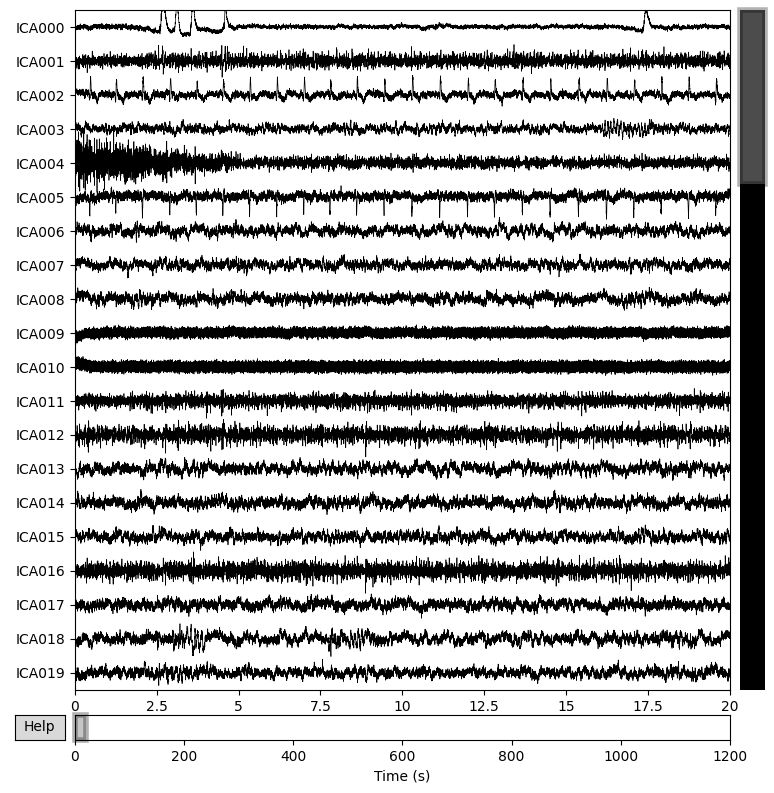

In [39]:
ica_listes.plot_sources(raw)

## Detection and rejection of physiological artefacts

In [80]:
ecg_indices, ecg_scores = ica_phrases.find_bads_ecg(epochs_phrases, ch_name="EEG059", method='correlation', threshold='auto')
eog_indices, eog_scores = ica_phrases.find_bads_eog(epochs_phrases, ch_name=["EEG057", "EEG058"])

Using EOG channels: EEG057, EEG058


In [81]:
art = list(set(eog_indices + ecg_indices))
art.sort()
print(f"Ocular artefacts {eog_indices}")
print(f"Cardiac artefacts {ecg_indices}")
print(f"All automatically detected artefacts {art}")

Ocular artefacts [0, 4]
Cardiac artefacts [23]
All automatically detected artefacts [0, 4, 23]


In [82]:
ica_phrases.exclude = art

In [85]:
ecg_indices, ecg_scores = ica_phrases.find_bads_ecg(epochs_listes, ch_name="EEG059", method='correlation', threshold='auto')
eog_indices, eog_scores = ica_phrases.find_bads_eog(epochs_listes, ch_name=["EEG057", "EEG058"])

Using EOG channels: EEG057, EEG058


In [86]:
art = list(set(eog_indices + ecg_indices))
art.sort()
print(f"Ocular artefacts {eog_indices}")
print(f"Cardiac artefacts {ecg_indices}")
print(f"All automatically detected artefacts {art}")

Ocular artefacts [0, 4]
Cardiac artefacts [23]
All automatically detected artefacts [0, 4, 23]


In [88]:
ica_listes.exclude = art

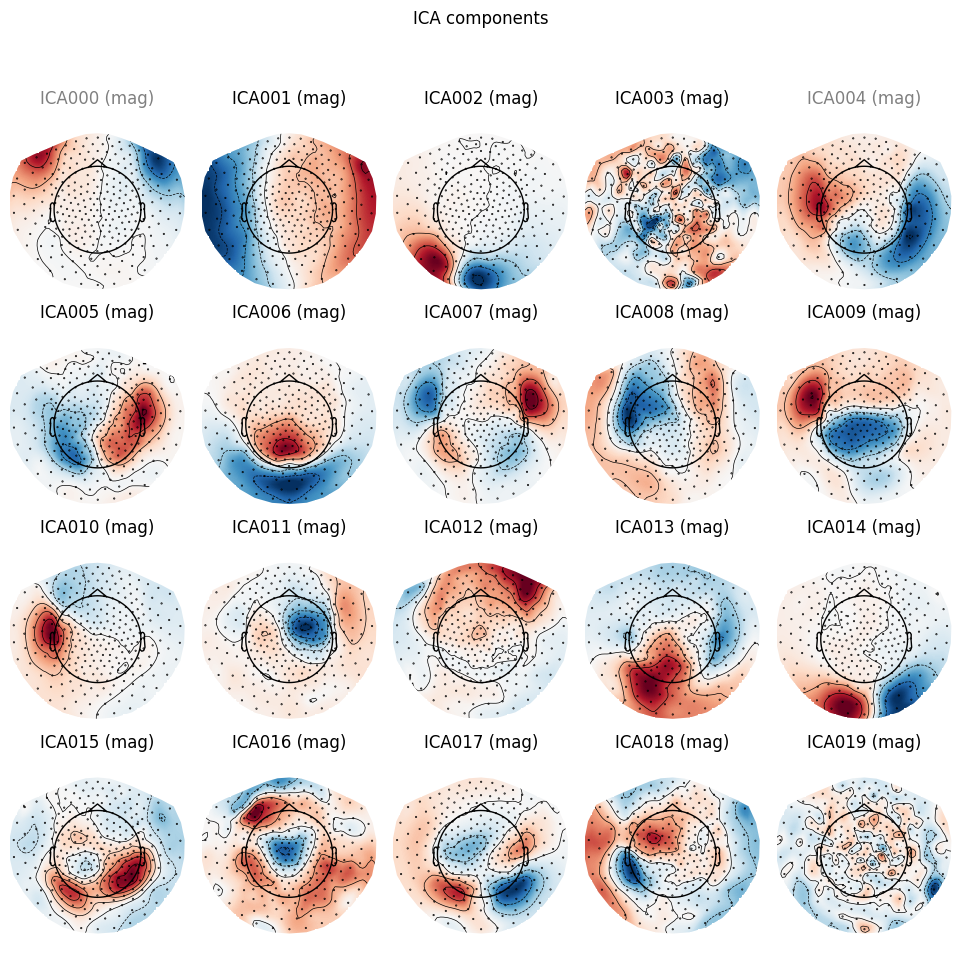

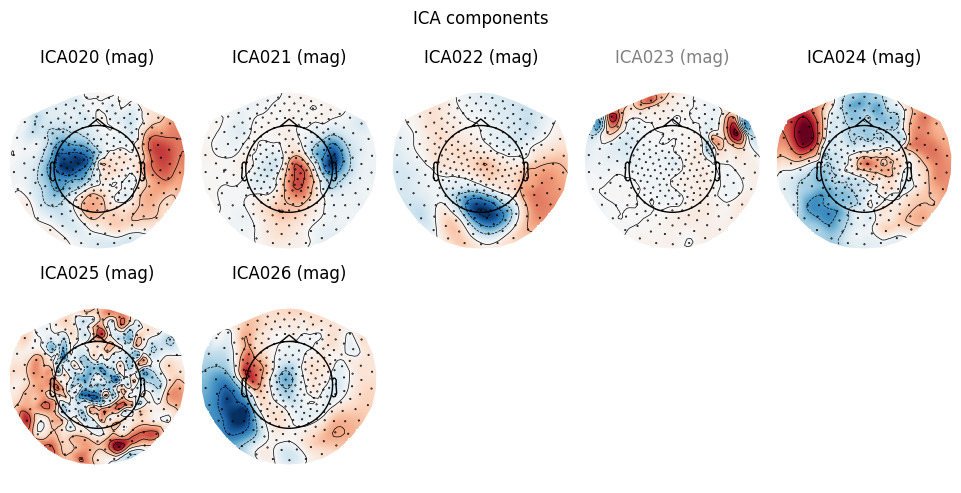

[<MNEFigure size 975x967 with 20 Axes>, <MNEFigure size 975x496 with 7 Axes>]

In [89]:
ica_listes.plot_components()

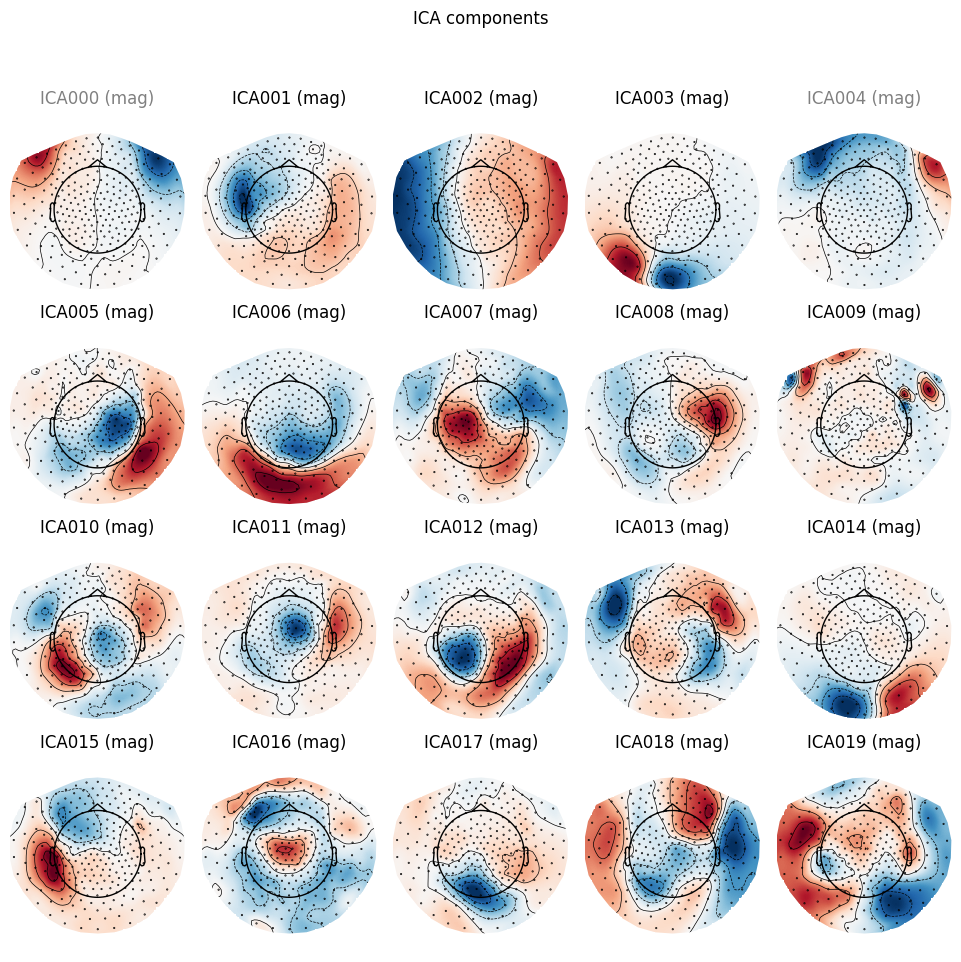

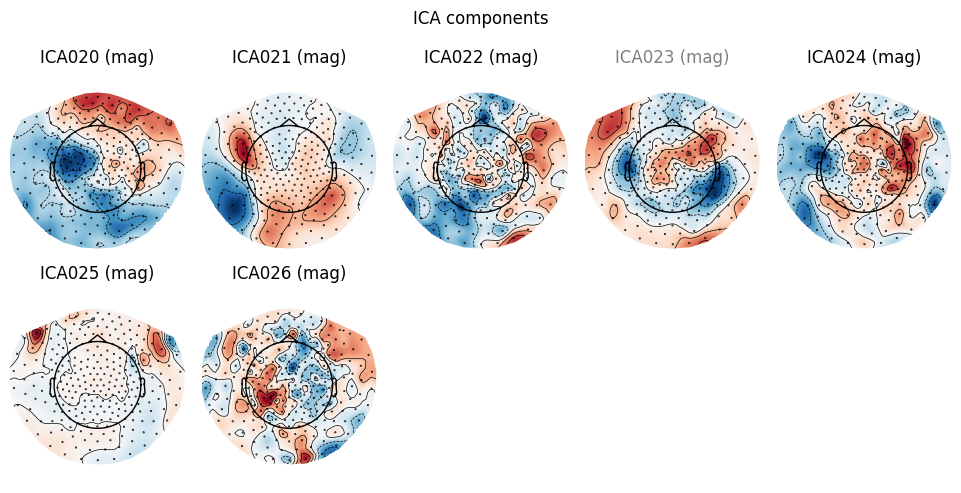

[<MNEFigure size 975x967 with 20 Axes>, <MNEFigure size 975x496 with 7 Axes>]

In [90]:
ica_phrases.plot_components()

In [70]:
print(raw.info['ch_names'])

['UDIO001', 'UPPT001', 'UPPT002', 'BG1-4304', 'BG2-4304', 'BG3-4304', 'BP1-4304', 'BP3-4304', 'BR1-4304', 'BR2-4304', 'BR3-4304', 'G11-4304', 'G12-4304', 'G13-4304', 'G22-4304', 'G23-4304', 'P11-4304', 'P12-4304', 'P13-4304', 'P22-4304', 'P23-4304', 'Q11-4304', 'Q12-4304', 'Q13-4304', 'Q22-4304', 'Q23-4304', 'R11-4304', 'R12-4304', 'R13-4304', 'R22-4304', 'R23-4304', 'MLC11-4304', 'MLC12-4304', 'MLC13-4304', 'MLC14-4304', 'MLC15-4304', 'MLC16-4304', 'MLC17-4304', 'MLC21-4304', 'MLC22-4304', 'MLC23-4304', 'MLC24-4304', 'MLC25-4304', 'MLC31-4304', 'MLC32-4304', 'MLC41-4304', 'MLC42-4304', 'MLC51-4304', 'MLC52-4304', 'MLC53-4304', 'MLC54-4304', 'MLC55-4304', 'MLC61-4304', 'MLC62-4304', 'MLC63-4304', 'MLF11-4304', 'MLF12-4304', 'MLF13-4304', 'MLF14-4304', 'MLF21-4304', 'MLF22-4304', 'MLF23-4304', 'MLF24-4304', 'MLF25-4304', 'MLF31-4304', 'MLF32-4304', 'MLF33-4304', 'MLF34-4304', 'MLF35-4304', 'MLF41-4304', 'MLF42-4304', 'MLF43-4304', 'MLF44-4304', 'MLF45-4304', 'MLF46-4304', 'MLF51-4304', 

In [72]:
for i in range(290,351):
    channel_type = mne.io.pick.channel_type(raw.info, i)
    print(f'Channel #{i} is of type:', channel_type)

Channel #290 is of type: mag
Channel #291 is of type: mag
Channel #292 is of type: mag
Channel #293 is of type: mag
Channel #294 is of type: mag
Channel #295 is of type: mag
Channel #296 is of type: mag
Channel #297 is of type: mag
Channel #298 is of type: mag
Channel #299 is of type: mag
Channel #300 is of type: mag
Channel #301 is of type: mag
Channel #302 is of type: mag
Channel #303 is of type: mag
Channel #304 is of type: eeg
Channel #305 is of type: eeg
Channel #306 is of type: eeg
Channel #307 is of type: eeg


IndexError: list index out of range

## Epoch data and artefact rejection

In [44]:
tmin = -0.2  # start of each epoch (200ms before the trigger)
tmax = 13 # end of each epoch (800ms after the trigger)

Define the baseline period

In [24]:
baseline = (-0.2, 0)  # means from 200ms before to stim onset (t = 0)

We also pick channels now - MEG, EEG and EOG channels

In [23]:
picks = mne.pick_types(raw.info, meg=True, eeg=True, eog=True,
                       stim=False, exclude='bads')

Now we can put all of this together and create epochs:

In [25]:
epochs = mne.Epochs(raw, events, event_id, tmin, tmax, proj=True,
                    picks=picks, baseline=baseline)

Not setting metadata
100 matching events found
Applying baseline correction (mode: mean)
0 projection items activated


Reject epochs that contains artefacts

In [26]:
ar = AutoReject()
epochs.load_data()
epochs_clean = ar.fit_transform(epochs)  

Using data from preloaded Raw for 100 events and 1201 original time points ...
2 bad epochs dropped
Removing 5 compensators from info because not all compensation channels were picked.
Running autoreject on ch_type=mag
Removing 5 compensators from info because not all compensation channels were picked.
Removing 5 compensators from info because not all compensation channels were picked.


/home/lucas/env_python/mne/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| Creating augmented epochs : 273/273 [01:14<00:00,    3.64it/s]
100%|██████████| Computing thresholds ... : 273/273 [03:26<00:00,    1.32it/s]


















































100%|██████████| Repairing epochs : 98/98 [00:01<00:00,   97.56it/s]



































































































100%|██████████| Repairing epochs : 98/98 [00:21<00:00,    4.65it/s]






















100%|██████████| Fold : 10/10 [00:23<00:00,    2.34s/it]



































































































100%|██████████| Repairing epochs : 98/98 [00:22<00:00,    4.45it/s]






















100%|██████████| Fold : 





Estimated consensus=0.50 and n_interpolate=32
Removing 5 compensators from info because not all compensation channels were picked.






































































































100%|██████████| Repairing epochs : 98/98 [00:20<00:00,    4.77it/s]

Dropped 3 epochs: 60, 61, 62


In [27]:
print(epochs_clean)  # let's look at some details about the epochs object

<Epochs |  95 events (all good), -0.2 - 0.8 sec, baseline -0.2 – 0 sec, ~262.5 MB, data loaded,
 '1': 30
 '2': 3
 '5': 14
 '6': 1
 'instruction': 1
 'O': 46>


In [28]:
epochs_clean.load_data()  # load data in memory

Number of events,95
Events,1: 302: 35: 146: 1O: 46instruction: 1
Time range,-0.200 – 0.800 sec
Baseline,-0.200 – 0.000 sec


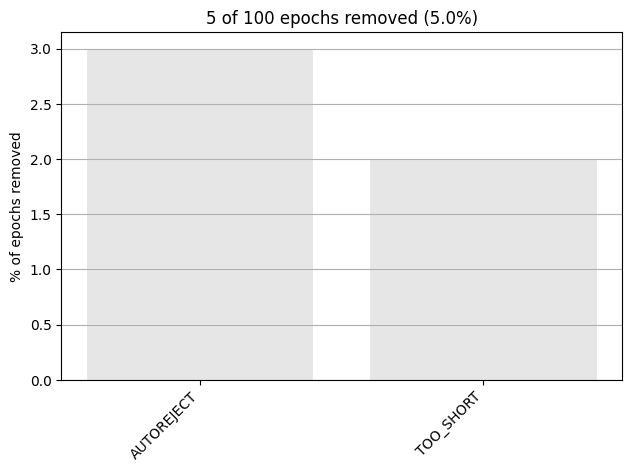

In [29]:
%matplotlib inline
epochs_clean.plot_drop_log();

Heartbeat artifacts (ECG)

Reconstructing ECG signal from Magnetometers
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 12000 samples (10.000 sec)

Number of ECG events detected : 92 (average pulse 91 / min.)
Not setting metadata
92 matching events found
No baseline correction applied
Using data from preloaded Raw for 92 events and 1201 original time points ...
2 bad epochs dropped
Not setting metadata
90 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
90 matching events found
No baseline correction applied
0 projection items activated
combining channels

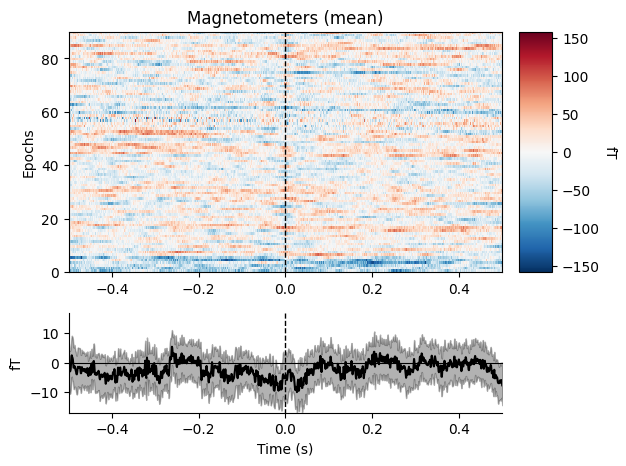

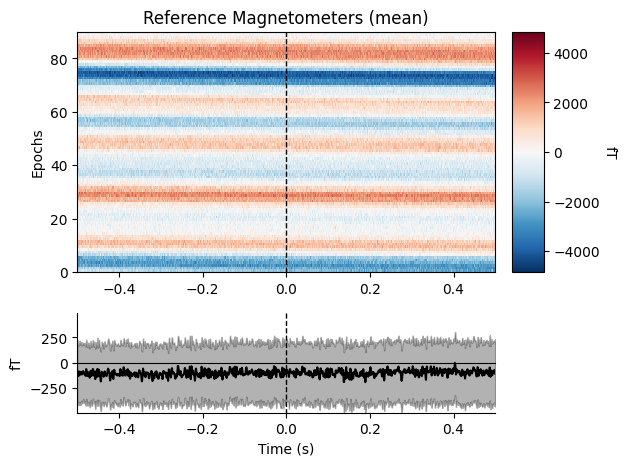

[<Figure size 640x480 with 3 Axes>, <Figure size 640x480 with 3 Axes>]

In [30]:
ecg_epochs = mne.preprocessing.create_ecg_epochs(raw)
ecg_epochs.plot_image(combine='mean')